In [ ]:
from IPython.core.interactiveshell import InteractiveShell
InteractiveShell.ast_node_interactivity = 'all'

In [ ]:
data_base_path = '/Users/rahulsomani/Dropbox/'
train_dir = 'shot_framing_train'
valid_dir = 'shot_framing_valid'

home_path = Path('/Users/rahulsomani/')

## Inference using `fastai`

### Load Data, Model

In [ ]:
from fastai.vision import *
from CinemaNet.convert import torch_to_onnx
from CinemaNet.custom_head import *

In [ ]:
data = ImageDataBunch.from_folder(data_base_path,
                                  train=train_dir,
                                  valid=valid_dir,
                                  size=(224,224), resize_method=ResizeMethod.SQUISH,
                                  ds_tfms=get_transforms(max_zoom=1.)).normalize(imagenet_stats)
arch = models.mobilenet_v2

In [ ]:
learn = cnn_learner(data, arch)
learn.load('/Users/rahulsomani/Downloads/bestmodel');

In [ ]:
np.random.seed(42)
samples = (list(learn.data.valid_ds.items)); np.random.shuffle(samples)
samples = samples[:5]

### Inference

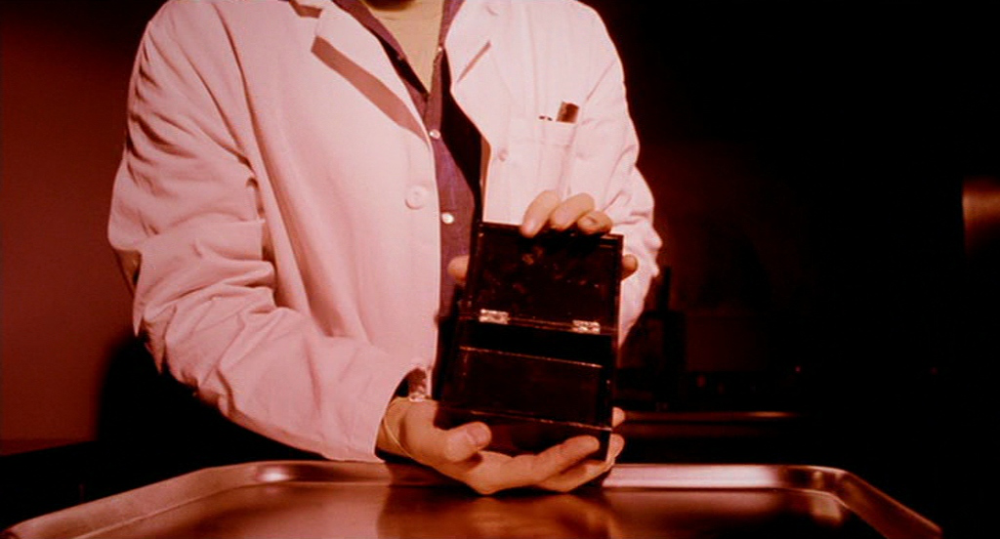

Prediction Confidence --> 0.996820330619812
Predicted Class       --> Medium


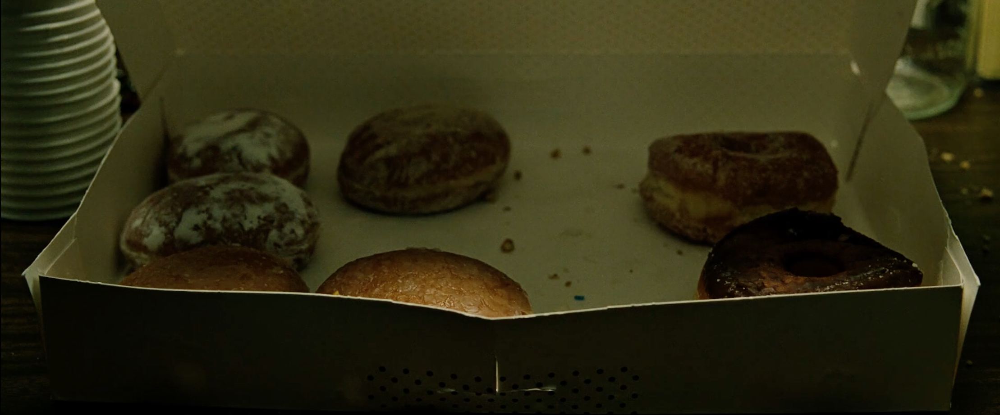

Prediction Confidence --> 0.9999525547027588
Predicted Class       --> Extreme Close-Up


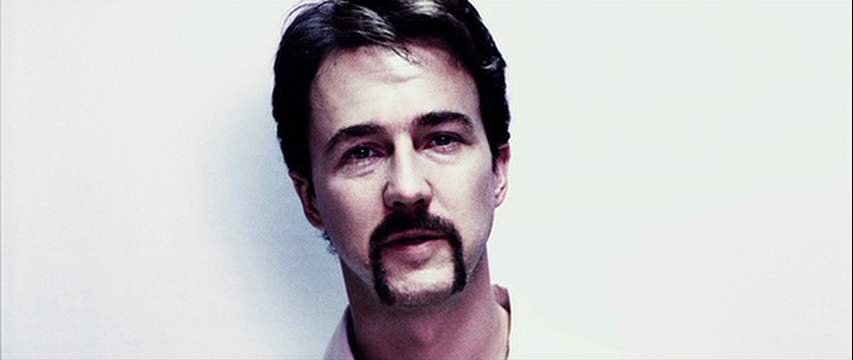

Prediction Confidence --> 0.9954751133918762
Predicted Class       --> Close-Up


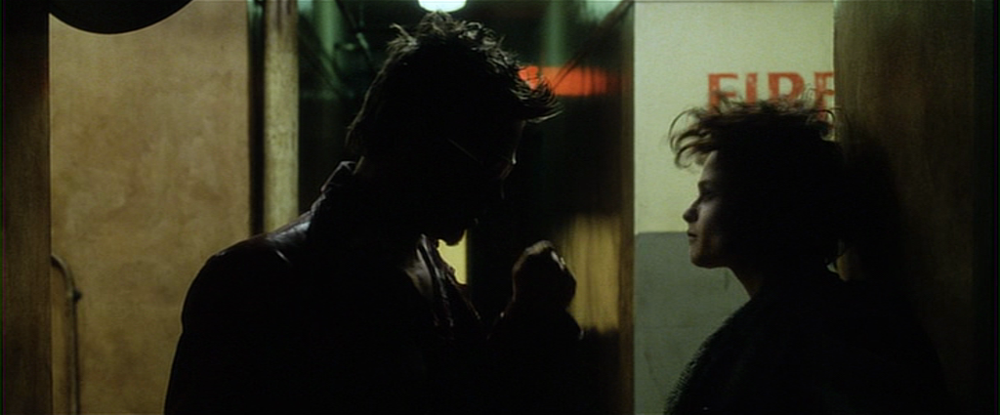

Prediction Confidence --> 0.9790847301483154
Predicted Class       --> Medium Close-Up


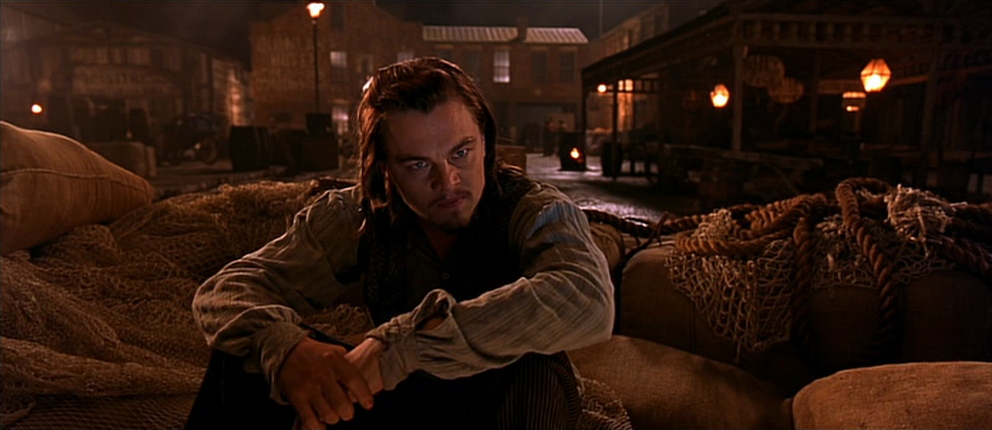

Prediction Confidence --> 0.9782800078392029
Predicted Class       --> Medium


In [ ]:
# internally, the images get transformed to (224,224)

for sample in samples: 
    x = open_image(sample)
    x
    cat, _, preds = learn.predict(x)
    print(f'Prediction Confidence --> {preds[preds.argmax()]}')
    print(f'Predicted Class       --> {cat}')

## Inference: `PyTorch` Feature Extraction + `PyTorch` Head

Splitting the `fastai` model into body + head, then using `PIL` to read in the image and `torchvision.transforms.functional` to convert to a `torch.Tensor`. <br>
Predictions still aren't as accurate as the default `fastai` ones. This _might_ be because the images aren't cropped as the validation images originally were.

### Separate Model into Feature Extractor (`body`) and Head

In [ ]:
len(learn.model)
body = learn.model[0]
head = learn.model[1]

2

In [ ]:
body.eval();
head.eval();

### Inference

In [ ]:
from PIL import Image
import torchvision.transforms.functional as TTF
import torch
import numpy as np

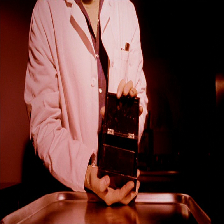

'Prediction Confidence --> 0.9950897693634033'

'Predicted Class       --> Medium'

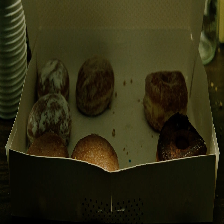

'Prediction Confidence --> 0.46282005310058594'

'Predicted Class       --> Extreme Close-Up'

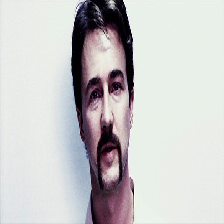

'Prediction Confidence --> 0.9957459568977356'

'Predicted Class       --> Close-Up'

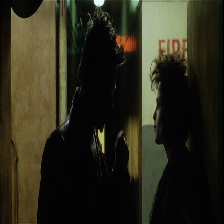

'Prediction Confidence --> 0.7126195430755615'

'Predicted Class       --> Medium Close-Up'

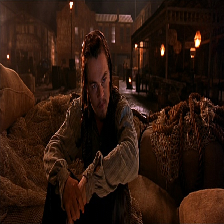

'Prediction Confidence --> 0.9478987455368042'

'Predicted Class       --> Medium'

In [ ]:
softmax = nn.Softmax(dim=1)
for sample in samples:
    image = Image.open(sample).resize((224,224)).convert('RGB')
    image
    x = TTF.to_tensor(image).unsqueeze(0) # convert to normalised tensor
    
    feature   = body(x)
    raw_preds = head(feature)
    
    out = softmax(raw_preds)
    #f'Input Image Size               --> {x.shape}'
    #f'Feature Extractor Output Shape --> {feature.shape}'
    f'Prediction Confidence --> {out[0][out.argmax()]}'
    f'Predicted Class       --> {data.classes[out.argmax()]}'
    print()

### Feature Shape (matches a `tf`/`keras` `mobilenet_v2`)...

...with some transposing

In [ ]:
feature.shape

torch.Size([1, 1280, 7, 7])

## Converting the `PyTorch` Head to `Keras`/`Tf`

[SOURCE](https://nbviewer.jupyter.org/github/onnx/tutorials/blob/master/tutorials/PytorchTensorflowMnist.ipynb#Save-the-trained-model)

### Torch to ONNX

In [ ]:
from CinemaNet.custom_head import *

In [ ]:
torch.save(head.state_dict(), home_path/'Desktop'/'head.pth')

In [ ]:
# redefine model to avoid onnx troubles

learner = cnn_learner(data, models.mobilenet_v2)
head = learner.model[1]
head.load_state_dict(torch.load(home_path/'Desktop'/'head.pth'))

dummy_input = torch.rand(*feature.shape)

torch.onnx.export(head, dummy_input, home_path/'Desktop'/'head.onnx')

<All keys matched successfully>

### ONNX to TF

In [ ]:
import onnx
from onnx_tf.backend import prepare

/Users/rahulsomani/onnx-tensorflow/onnx_tf/common/__init__.py:89: UserWarning: onnx_tf.common.get_outputs_names is deprecated. It will be removed in future release. Use TensorflowGraph.get_outputs_names instead.
  warnings.warn(message)


In [ ]:
head_onnx = onnx.load(home_path/'Desktop'/'head.onnx')
head_tf = prepare(head_onnx);
head_tf.export_graph(home_path/'Desktop'/'head.pb')

/Users/rahulsomani/onnx-tensorflow/onnx_tf/common/handler_helper.py:37: UserWarning: Unknown op ConstantFill in domain `ai.onnx`.
  handler.ONNX_OP, handler.DOMAIN or "ai.onnx"))
/Users/rahulsomani/onnx-tensorflow/onnx_tf/common/handler_helper.py:34: UserWarning: Fail to get since_version of ConvInteger in domain `` with max_inclusive_version=9. Set to 1.
  handler.ONNX_OP, handler.DOMAIN, version))
/Users/rahulsomani/onnx-tensorflow/onnx_tf/common/handler_helper.py:34: UserWarning: Fail to get since_version of DequantizeLinear in domain `` with max_inclusive_version=9. Set to 1.
  handler.ONNX_OP, handler.DOMAIN, version))
/Users/rahulsomani/onnx-tensorflow/onnx_tf/common/handler_helper.py:34: UserWarning: Fail to get since_version of GatherND in domain `` with max_inclusive_version=9. Set to 1.
  handler.ONNX_OP, handler.DOMAIN, version))
/Users/rahulsomani/onnx-tensorflow/onnx_tf/common/handler_helper.py:37: UserWarning: Unknown op ImageScaler in domain `ai.onnx`.
  handler.ONNX_OP,

## Inference: `PyTorch` Feature Extractor + Converted `TF` Head

Identical to the previous section (`PyTorch` feature extractor + `PyTorch` head). This means that our `tf` head export works successfully.

In [ ]:
def extract_features(fname,
                     body: torch.nn.Module,
                     input_size: tuple = (224,224),
                     return_img: bool  = True) -> np.array:
    'PyTorch Image Feature Extractor'
    from PIL import Image
    import torchvision.transforms.functional as TTF
    
    # read and preprocess
    img = Image.open(fname).convert('RGB')
    plt.show(img)
    x = TTF.to_tensor(img.resize(input_size)).unsqueeze(0)
    
    # move to the right device (CPU | GPU)
    if torch.cuda.is_available(): x,body = x.cuda(),body.cuda()
    else: x,body = x.cpu(), body.cpu()
       
    # return image without resizing
    if return_img: return img, body(x).cpu().data.numpy()
    else: return body(x).cpu().data.numpy()

/Users/rahulsomani/anaconda3/lib/python3.7/site-packages/ipykernel_launcher.py:11: MatplotlibDeprecationWarning: Passing the block parameter of show() positionally is deprecated since Matplotlib 3.1; the parameter will become keyword-only in 3.3.
  # This is added back by InteractiveShellApp.init_path()


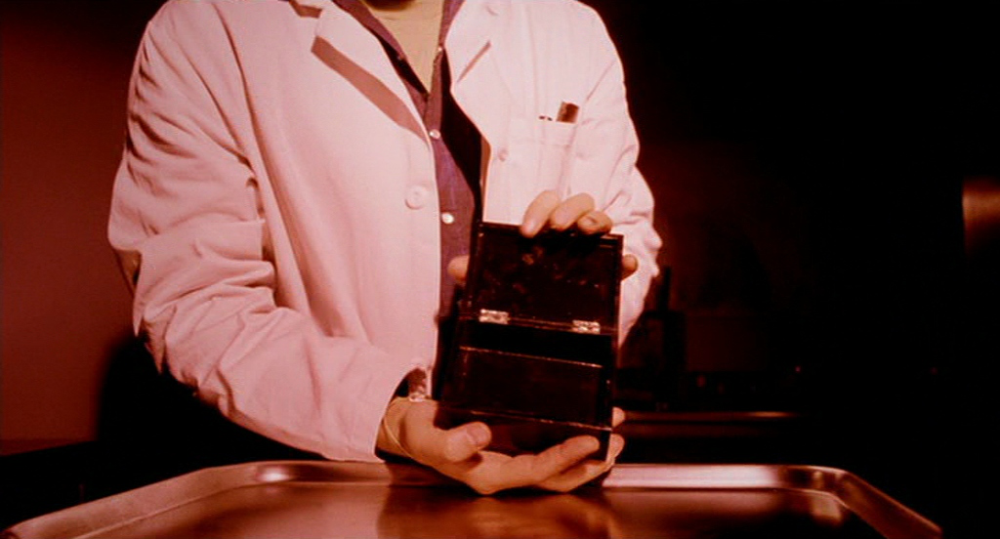

Prediction Class      --> Medium
Prediction Confidence -->  99.51 %



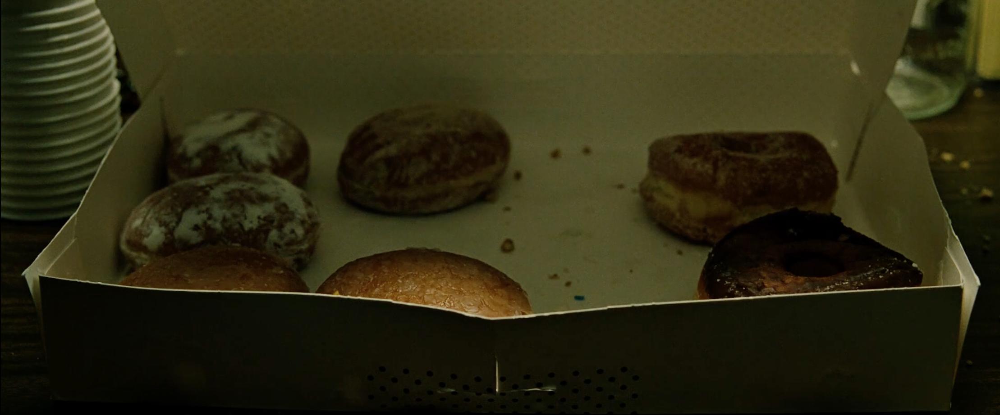

Prediction Class      --> Extreme Close-Up
Prediction Confidence -->  46.28 %



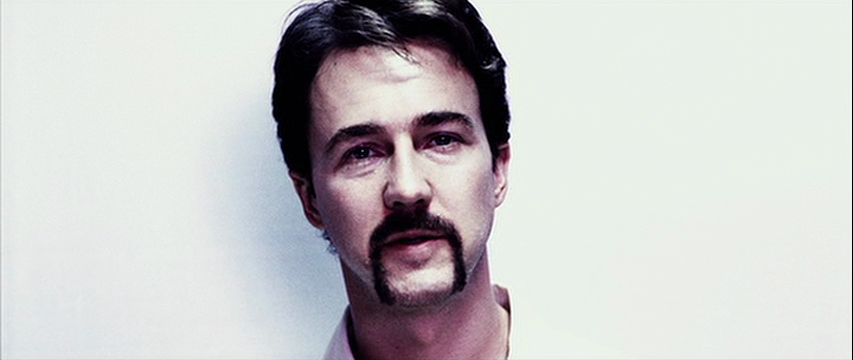

Prediction Class      --> Close-Up
Prediction Confidence -->  99.57 %



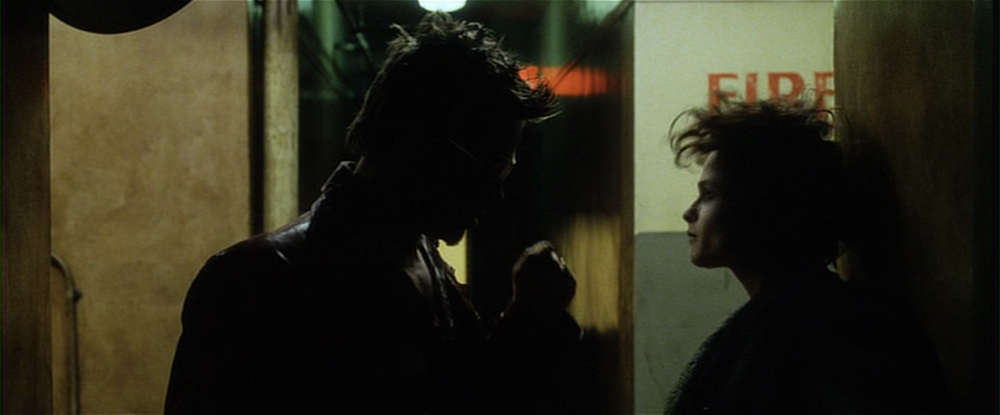

Prediction Class      --> Medium Close-Up
Prediction Confidence -->  71.26 %



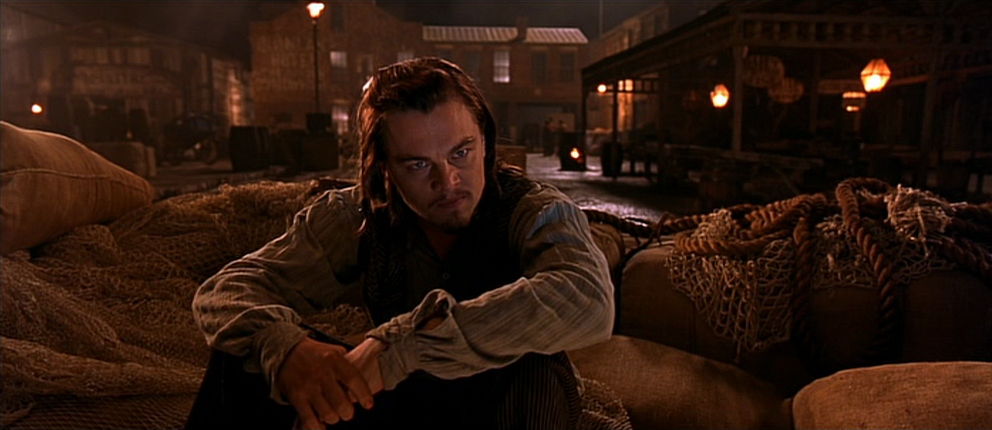

Prediction Class      --> Medium
Prediction Confidence -->  94.79 %



In [ ]:
for sample in samples:
    img, features = extract_features(sample, body)
    img
    output = head_tf.run(features)
    output = F.softmax(torch.tensor(output[0][0]), dim=-1) # not essential
    print(f'Prediction Class      --> {data.classes[output.argmax()]}')
    print(f'Prediction Confidence --> {output[output.argmax()]*100: .02f} %')
    print()

In [ ]:
learn.data.valid_ds.tfms

[RandTransform(tfm=TfmCrop (crop_pad), kwargs={}, p=1.0, resolved={'padding_mode': 'reflection', 'row_pct': 0.5, 'col_pct': 0.5}, do_run=True, is_random=True, use_on_y=True)]

## Inference: `TF` Feature Extractor + Converted `TF` Head

Predictions are almost nonsensical. There's probably a significant difference between the `Keras` and `torchvision` pretrained models (feature extractors), and heads trained on them can't be used interchangeably. <br>
One key factor to explain this is that Keras and torchvision's preprocessing steps are different.

Soltuion -- either do entire training in `tf`, or, port the `Keras` pretrained model to `PyTorch`, and reuse the `fastai` code we have in place to train the head from scratch.

In [ ]:
import tensorflow as tf

In [ ]:
base_model = tf.keras.applications.MobileNetV2(input_shape=(224, 224, 3),
                                               include_top=False,
                                               weights='imagenet')
base_model.trainable = False

In [ ]:
from tensorflow.keras.preprocessing import image
from tensorflow.keras.applications.mobilenet_v2 import preprocess_input

In [ ]:
img = image.load_img(samples[0], target_size=(224,224))
x   = image.img_to_array(img)
x   = np.expand_dims(x, axis=0)
x   = preprocess_input(x)

tf_features = base_model.predict(x)

In [ ]:
tf_features.shape

(1, 7, 7, 1280)

In [ ]:
tf_features.transpose(0, 3, 1, 2).shape
tf_features.transpose(0, 3, 2, 1).shape

(1, 1280, 7, 7)

(1, 1280, 7, 7)

In [ ]:
head_tf.run(tf_features.transpose(0, 3, 1, 2))

Outputs(_0=array([[ 2.386467, -5.11804 , -1.862759, -2.662491,  1.040387,  1.705916]], dtype=float32))

### Using Keras' Preprocessing

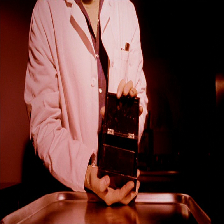

Prediction Class      --> Close-Up
Prediction Confidence -->  238.65 %



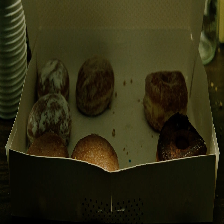

Prediction Class      --> Medium
Prediction Confidence -->  481.39 %



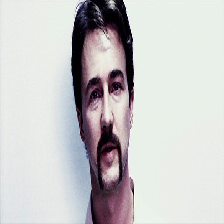

Prediction Class      --> Medium
Prediction Confidence -->  346.37 %



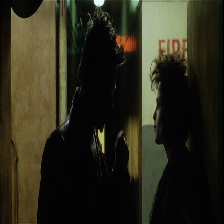

Prediction Class      --> Medium
Prediction Confidence -->  494.59 %



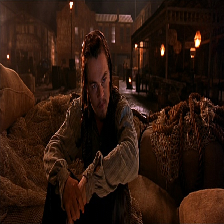

Prediction Class      --> Medium Close-Up
Prediction Confidence -->  449.05 %



In [ ]:
for sample in samples:
    img = image.load_img(sample, target_size=(224,224))
    img
    x   = image.img_to_array(img)
    x   = np.expand_dims(x, axis=0)
    x   = preprocess_input(x)
    features = base_model.predict(x)
    features = features.transpose(0, 3, 2, 1) # reshape for the head
    #features = features.transpose(0, 3, 1, 2) # reshape for the head
    output   = head_tf.run(features)
    #output   = tf.keras.activations.softmax(output)
    print(f'Prediction Class      --> {data.classes[output[0][0].argmax()]}')
    print(f'Prediction Confidence --> {output[0][0][output[0][0].argmax()]*100: .02f} %')
    print()

### Using Torchvision Preprocessing

Just to see if it makes a difference. It doesn't. This section can be ignored completely.

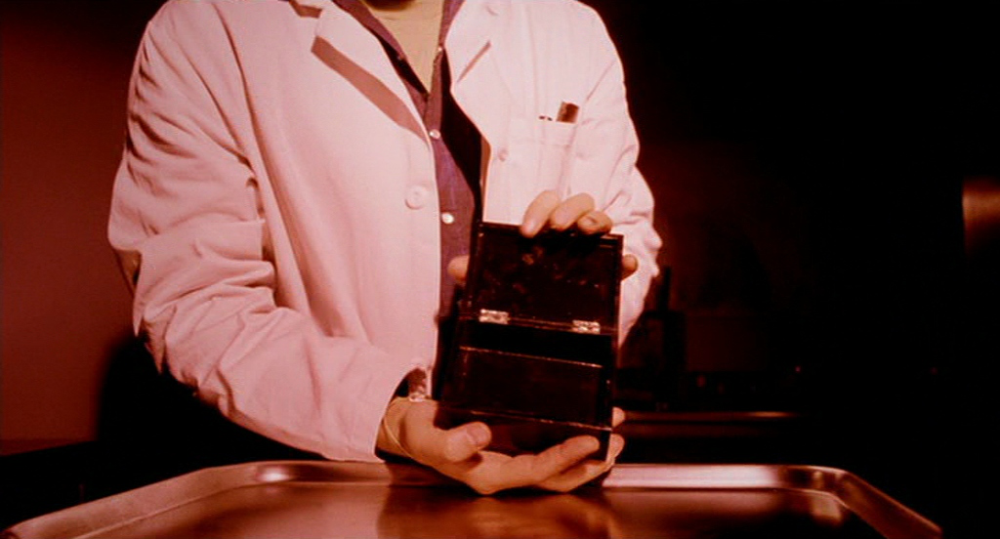

Prediction Class      --> Medium Close-Up
Prediction Confidence -->  311.40 %



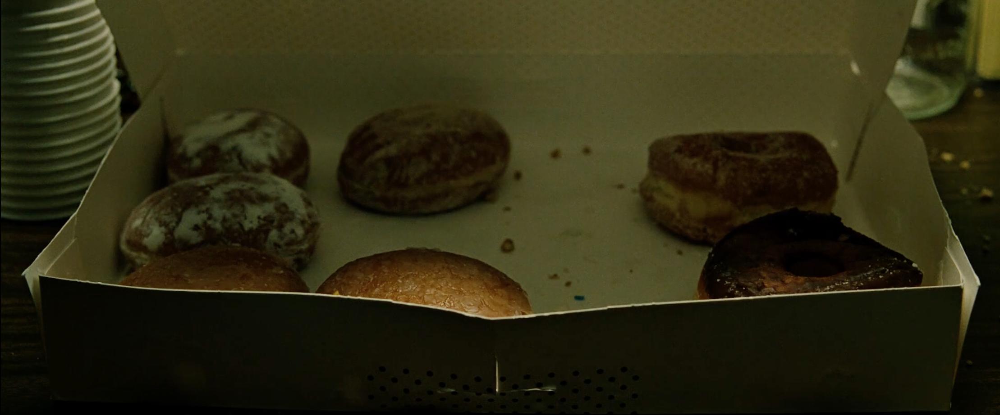

Prediction Class      --> Medium
Prediction Confidence -->  410.38 %



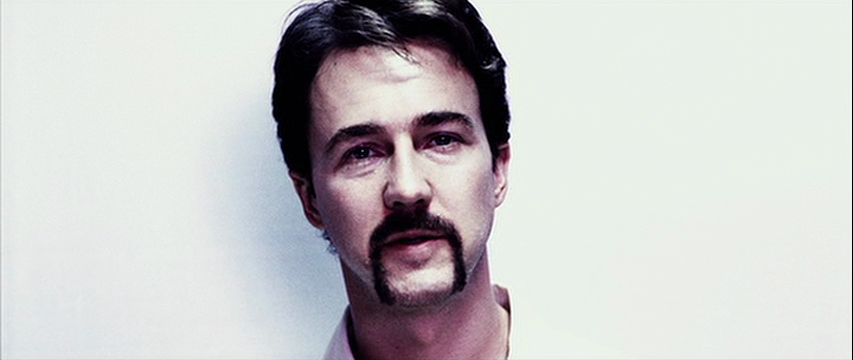

Prediction Class      --> Medium Close-Up
Prediction Confidence -->  119.43 %



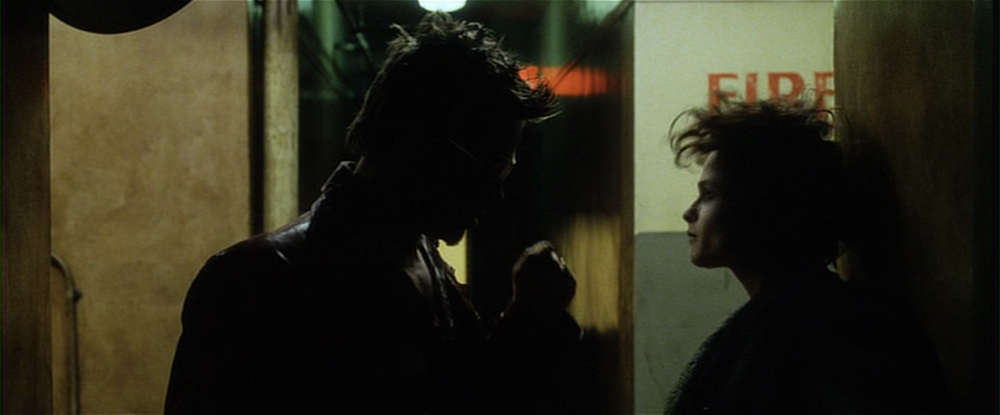

Prediction Class      --> Medium Close-Up
Prediction Confidence -->  442.69 %



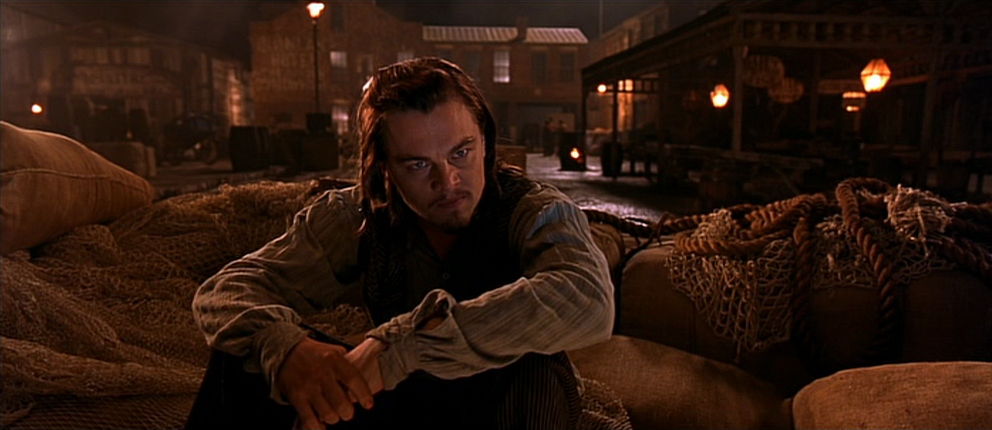

Prediction Class      --> Medium Close-Up
Prediction Confidence -->  425.91 %



In [ ]:
for sample in samples:
    img = Image.open(sample).convert('RGB')
    img
    x = TTF.to_tensor(img.resize((224,224))).unsqueeze(0) # (1,3,224,224)
    x = x.permute(0, 2, 3, 1).cpu().data.numpy()          # (1,224,224,3)
    features = base_model.predict(x)
    features = features.transpose(0, 3, 2, 1) # reshape for the head
    #features = features.transpose(0, 3, 1, 2) # reshape for the head
    output   = head_tf.run(features)
    #output   = tf.keras.activations.softmax(output)
    print(f'Prediction Class      --> {data.classes[output[0][0].argmax()]}')
    print(f'Prediction Confidence --> {output[0][0][output[0][0].argmax()]*100: .02f} %')
    print()

## Next Steps?